In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
import tensorflow
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import copy
import pandas as pd
import ntpath
import ydata_profiling
import skimage
from skimage.util import random_noise
import random
import warnings
import random
import re
from numpy import expand_dims
from skimage import io 
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
warnings.filterwarnings("ignore")
# customize display options for pandas
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [3]:
# test that tensorflow is using GPU
from tensorflow.python.client import device_lib
print("Num GPUs Available: ", tensorflow.config.list_physical_devices('GPU'))
print(tensorflow.test.gpu_device_name())

Num GPUs Available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
/device:GPU:0


## Reading Data

In [8]:
directory = "/Users/asera/Desktop/NNProject"
column_names = ["center_image_location", "left_image_location", "right_image_location", "steering_angle", "acceleration", "reverse", "speed"]
# convert data to a pandas dataframe
data = pd.read_csv(os.path.join(directory, "driving_log.csv"), names=column_names)
#correct a typo with image path 
data['center_image_location'] = data['center_image_location'].replace("NN Project", "NNProject", regex = True)
data['left_image_location'] = data['left_image_location'].replace("NN Project", "NNProject", regex = True)
data['right_image_location'] = data['right_image_location'].replace("NN Project", "NNProject", regex = True)
data.head(5)

,center_image_location,left_image_location,right_image_location,steering_angle,acceleration,reverse,speed
0,C:\Users\asera\Desktop\NNProject\IMG\center_2023_03_20_16_14_31_905.jpg,C:\Users\asera\Desktop\NNProject\IMG\left_2023_03_20_16_14_31_905.jpg,C:\Users\asera\Desktop\NNProject\IMG\right_2023_03_20_16_14_31_905.jpg,0.0,0.0,0.0,25.82486
1,C:\Users\asera\Desktop\NNProject\IMG\center_2023_03_20_16_14_31_978.jpg,C:\Users\asera\Desktop\NNProject\IMG\left_2023_03_20_16_14_31_978.jpg,C:\Users\asera\Desktop\NNProject\IMG\right_2023_03_20_16_14_31_978.jpg,0.0,0.0,0.0,25.61721
2,C:\Users\asera\Desktop\NNProject\IMG\center_2023_03_20_16_14_32_053.jpg,C:\Users\asera\Desktop\NNProject\IMG\left_2023_03_20_16_14_32_053.jpg,C:\Users\asera\Desktop\NNProject\IMG\right_2023_03_20_16_14_32_053.jpg,0.0,0.0,0.0,25.41124
3,C:\Users\asera\Desktop\NNProject\IMG\center_2023_03_20_16_14_32_126.jpg,C:\Users\asera\Desktop\NNProject\IMG\left_2023_03_20_16_14_32_126.jpg,C:\Users\asera\Desktop\NNProject\IMG\right_2023_03_20_16_14_32_126.jpg,0.0,0.0,0.0,25.20692
4,C:\Users\asera\Desktop\NNProject\IMG\center_2023_03_20_16_14_32_199.jpg,C:\Users\asera\Desktop\NNProject\IMG\left_2023_03_20_16_14_32_199.jpg,C:\Users\asera\Desktop\NNProject\IMG\right_2023_03_20_16_14_32_199.jpg,0.0,0.0,0.0,25.05476


In [9]:
# just removes dangling spaces
def imagepath(path):
    path = path.strip()
    return path


# turns an absolute path into a relative path
def change_to_relative(path):
    # returns tuple (head, tail) where tail is everything after the final slash and head is everything otherwise
    head, tail = ntpath.split(path)
    return tail

# instead of the complete path, modify the dataset to use relative path
data["center_image_location"] = data["center_image_location"].apply(imagepath)
data["left_image_location"] = data["left_image_location"].apply(imagepath)
data["right_image_location"] = data["right_image_location"].apply(imagepath)

#the original pandas dataframe includes data from both routes of the simulator, so I will split it into data for the first route and the second route
data_route_1 = data.copy(deep = True)
data_route_2 = data.copy(deep = True)


#uses regular expressions to extract data created using the first route
def extract_first_route(center_location):
    return bool(re.match( ".*center_2023_03_20", center_location))


#uses regular expressions to extract data created using the second route
def extract_second_route(center_location):
    return bool(re.match( ".*center_2023_04_15", center_location))

#divides the data depending on which route was used
data_route_1 = data_route_1[data_route_1['center_image_location'].apply(lambda x: extract_first_route(x))]
data_route_2 = data_route_2[data_route_2['center_image_location'].apply(lambda x: extract_second_route(x))]

In [10]:
data_route_1.head(2)

,center_image_location,left_image_location,right_image_location,steering_angle,acceleration,reverse,speed
0,C:\Users\asera\Desktop\NNProject\IMG\center_2023_03_20_16_14_31_905.jpg,C:\Users\asera\Desktop\NNProject\IMG\left_2023_03_20_16_14_31_905.jpg,C:\Users\asera\Desktop\NNProject\IMG\right_2023_03_20_16_14_31_905.jpg,0.0,0.0,0.0,25.82486
1,C:\Users\asera\Desktop\NNProject\IMG\center_2023_03_20_16_14_31_978.jpg,C:\Users\asera\Desktop\NNProject\IMG\left_2023_03_20_16_14_31_978.jpg,C:\Users\asera\Desktop\NNProject\IMG\right_2023_03_20_16_14_31_978.jpg,0.0,0.0,0.0,25.61721


In [78]:
data_route_2.head(2)

,center_image_location,left_image_location,right_image_location,steering_angle,acceleration,reverse,speed
1794,C:\Users\asera\Desktop\NNProject\IMG\center_2023_04_15_21_07_49_251.jpg,C:\Users\asera\Desktop\NNProject\IMG\left_2023_04_15_21_07_49_251.jpg,C:\Users\asera\Desktop\NNProject\IMG\right_2023_04_15_21_07_49_251.jpg,0.0,0.0,0.0,1.344404
1795,C:\Users\asera\Desktop\NNProject\IMG\center_2023_04_15_21_07_49_318.jpg,C:\Users\asera\Desktop\NNProject\IMG\left_2023_04_15_21_07_49_318.jpg,C:\Users\asera\Desktop\NNProject\IMG\right_2023_04_15_21_07_49_318.jpg,0.0,0.0,0.0,1.109653


## Exploratory Data Analysis

### Exploring Full Data

In [ ]:
ydata_profiling.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

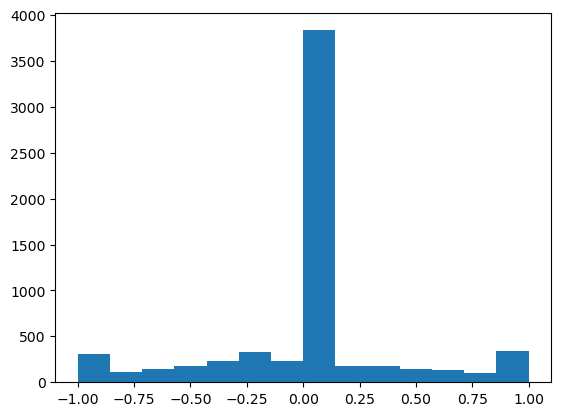

In [11]:
(n, bins, patches) = plt.hist(data['steering_angle'], bins = 'auto')

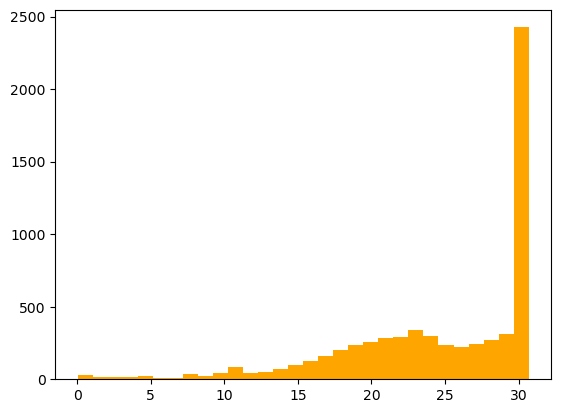

In [12]:
(n_speed, bins_speeed, patches_speed) = plt.hist(data['speed'], bins = 'auto', color="orange")

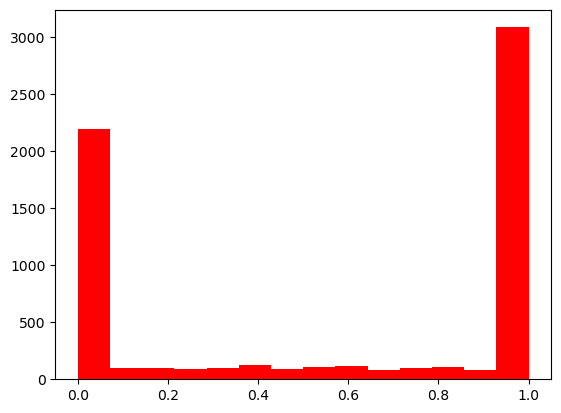

In [13]:
(n_acceleration, bins_acceleration, patches_acceleration) = plt.hist(data['acceleration'], bins = 'auto', color="red")

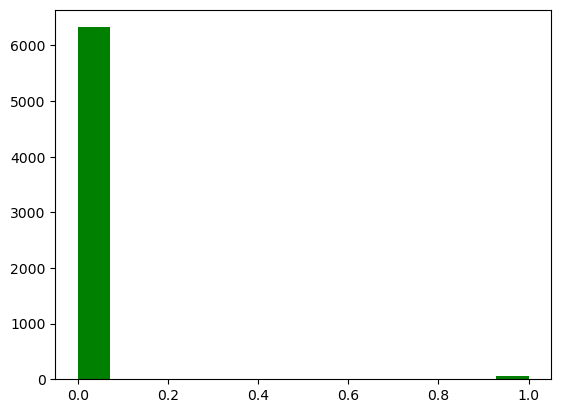

In [16]:
(n_reverse, bins_reverse, patches_reverse) = plt.hist(data['reverse'], bins = 'auto', color="green")

### Exploring Route_1 Data

In [ ]:
ydata_profiling.ProfileReport(data_route_1)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

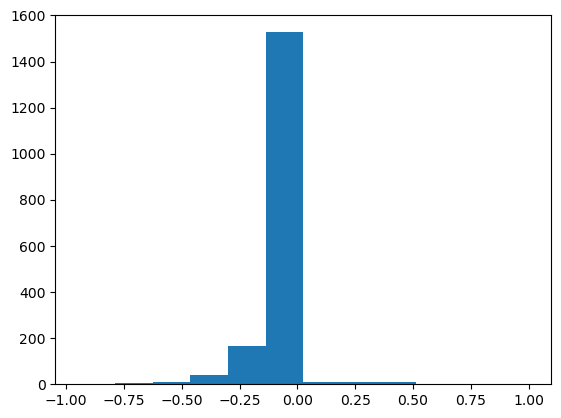

In [17]:
(n_1, bins_1, patches_1) = plt.hist(data_route_1['steering_angle'], bins = 'auto')


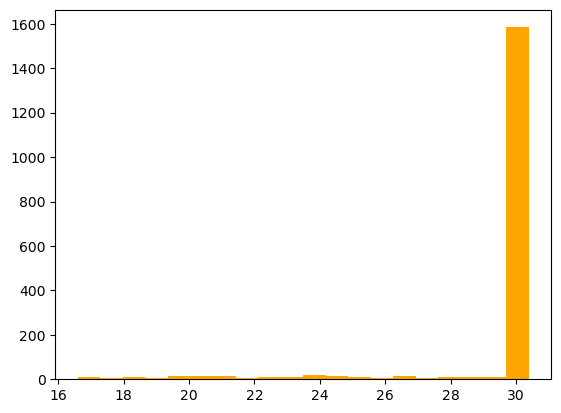

In [18]:
(n_speed_1, bins_speeed_1, patches_speed_1) = plt.hist(data_route_1['speed'], bins = 20, color="orange")

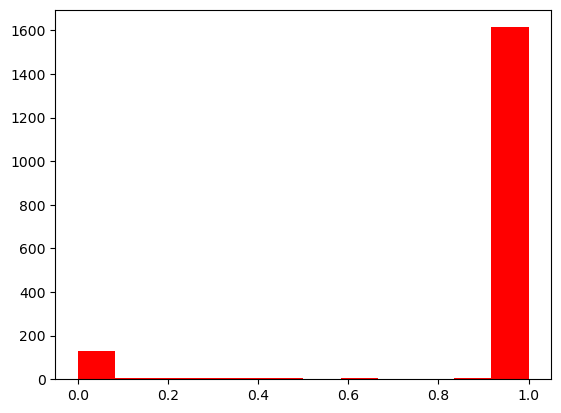

In [19]:
(n_acceleration_1, bins_acceleration_1, patches_acceleration_1) = plt.hist(data_route_1['acceleration'], bins = 'auto', color="red")

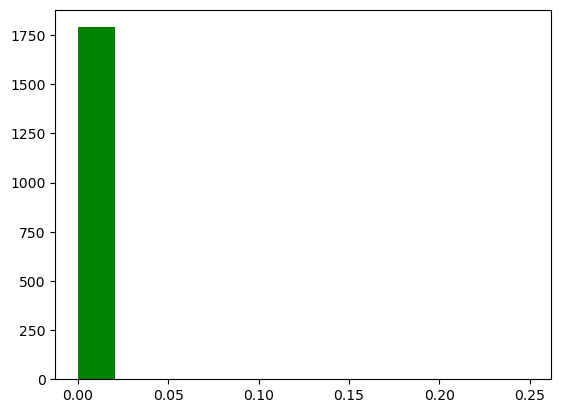

In [20]:
(n_reverse_1, bins_reverse_1, patches_reverse_1) = plt.hist(data_route_1['reverse'], bins = 'auto', color="green")

### Exploring Route_2 Data

In [ ]:
ydata_profiling.ProfileReport(data_route_2)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

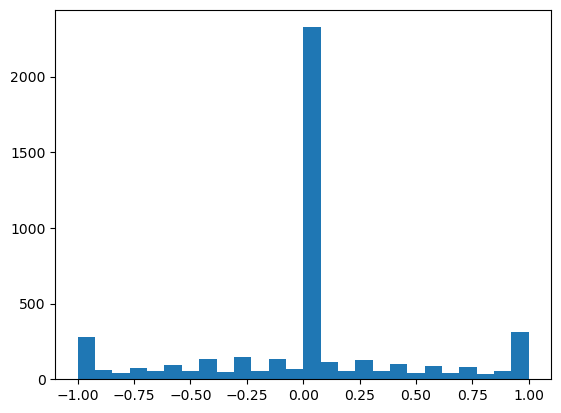

In [21]:
(n_2, bins_2, patches_2) = plt.hist(data_route_2['steering_angle'], bins = 26)

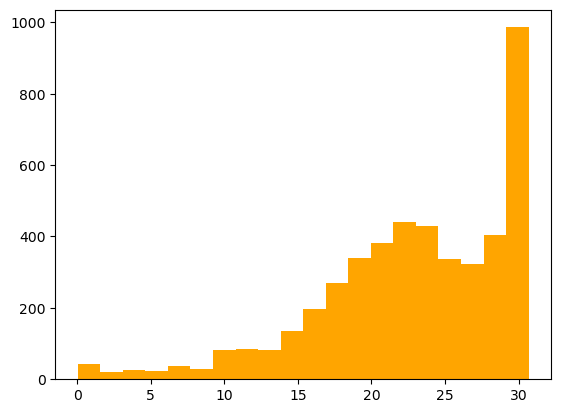

In [22]:
(n_speed_2, bins_speeed_2, patches_speed_2) = plt.hist(data_route_2['speed'], bins = 20, color="orange")

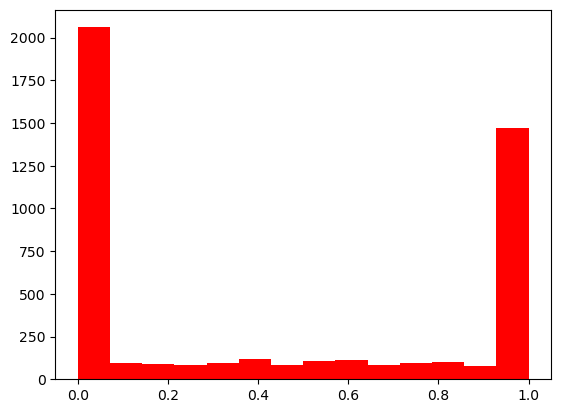

In [23]:
(n_acceleration_2, bins_acceleration_2, patches_acceleration_2) = plt.hist(data_route_2['acceleration'], bins = 'auto', color="red")

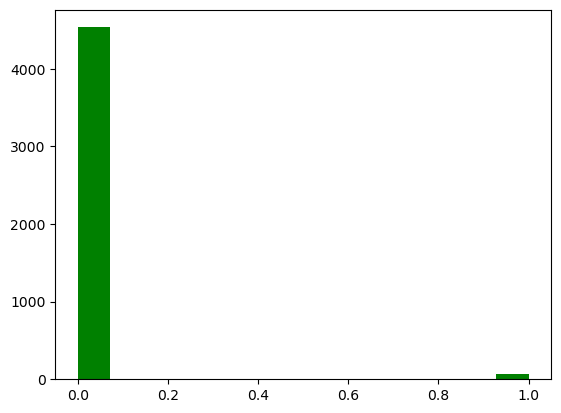

In [24]:
(n_reverse_2, bins_reverse_2, patches_reverse_2) = plt.hist(data_route_2['reverse'], bins = 'auto', color="green")

The steering angle for route 1 is clearly unbalanced with the vast majority of the turns being to the left. This unbalance will cause the model to always predict a left turn. So, we need to pre-process the data to account for this unbalance. One way to do that is by augmenting the data with more right-turns. In addition, we can remove some of the data where the car is moving straight to avoid having a biased moded. Also, we need to add noise to the dataset to boost the validity of our model.
## Data Augmentation 

In [14]:
#A function that displays the image given its path
def show_image_path(image_path):
    image = io.imread(image_path)
    i, (im1) = plt.subplots(1)
    i.set_figwidth(15)
    im1.imshow(image)


#A function that displays the image given the image itself
def show_image(image):
    i, (im1) = plt.subplots(1)
    i.set_figwidth(15)
    im1.imshow(image)
    

# This function will be used to show the effect of the pre-processing functions by displaying the image before and after edits
def display_two_images(image1, image2):
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))
    fig.tight_layout()
    axs[0].imshow(image1)
    axs[0].set_title("Original Image")
    axs[1].imshow(image2)
    axs[1].set_title("Edited Image")

In [16]:
# reads the data into three lists, one has the path to images, one has the images, and the last has the steering angle

def parse(df):
    # holds the path
    images = []
    # hold the actual image
    img = []
    # holds the steering angle
    angles = []
    for i in range(len(df)):
        # adds the steering angle three times because each steering angle corresponds to three images: center, left, and right
        angles.append(float(df.iloc[i][3])) 
        angles.append(float(df.iloc[i][3]))
        angles.append(float(df.iloc[i][3]))
        images.append(df.iloc[i][0])
        img.append(mpimg.imread(df.iloc[i][0]))
        images.append(df.iloc[i][1])
        img.append(mpimg.imread(df.iloc[i][1]))
        images.append(df.iloc[i][2])
        img.append(mpimg.imread(df.iloc[i][2]))
        
    return images, img, angles


#saves the image paths and the steering angles in lists
images, img, angles  = parse(data)        
images_route_1, img_1, angles_route_1 = parse(data_route_1)
images_route_2, img_2, angles_route_2 = parse(data_route_2)

Text(0.5, 1.0, 'Second Route')

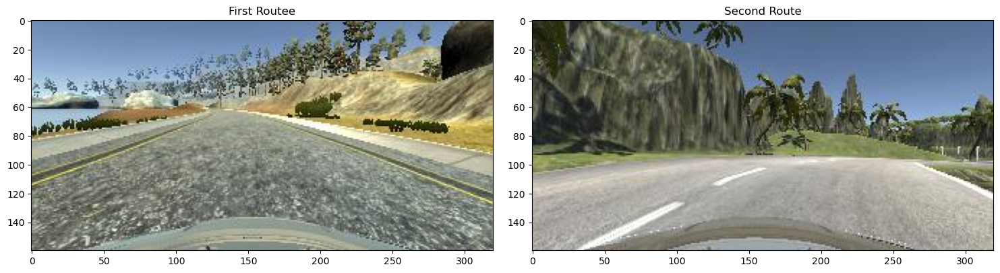

In [17]:
# One image from the first route and another image from the second route
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(img_1[0])
axs[0].set_title("First Routee")
axs[1].imshow(img_2[0])
axs[1].set_title("Second Route")

### Data Pre-Processing Functions

In [18]:
test_image = io.imread(images[8000])

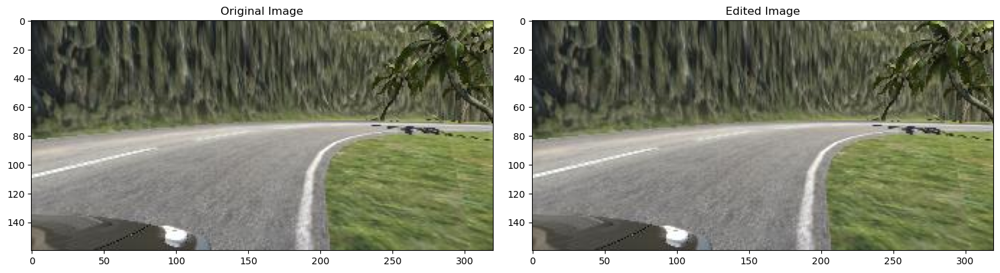

In [19]:
#normalize image pixel values i.e. makes pixel values between 0 and 1
def normalize(image):
    return image/255


display_two_images(test_image, normalize(test_image))

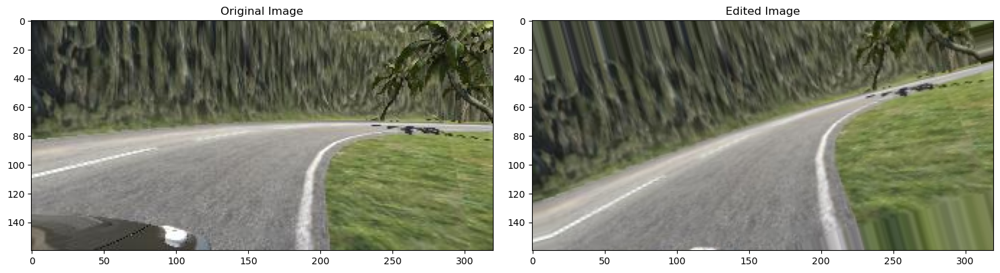

In [20]:
# rotates the image to add some noise
def rotate(image, range):
    datagen = ImageDataGenerator(rotation_range=range, fill_mode='nearest')
    samples = expand_dims(image, 0)
    it = datagen.flow(samples, batch_size=1)
    image = next(it)[0].astype('uint8')
    return image


display_two_images(test_image, rotate(test_image, 60))

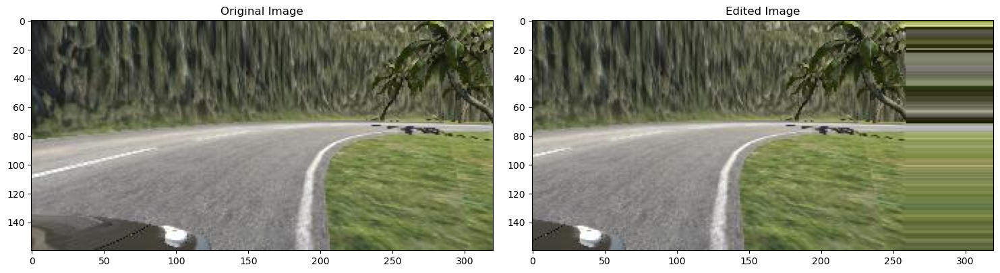

In [21]:
# shifts the image to add some noise
def shift(image, range):
    datagen = ImageDataGenerator(width_shift_range=[-range, range])
    samples = expand_dims(image, 0)
    it = datagen.flow(samples, batch_size=1)
    image = next(it)[0].astype('uint8')
    return image

display_two_images(test_image, shift(test_image, 60))

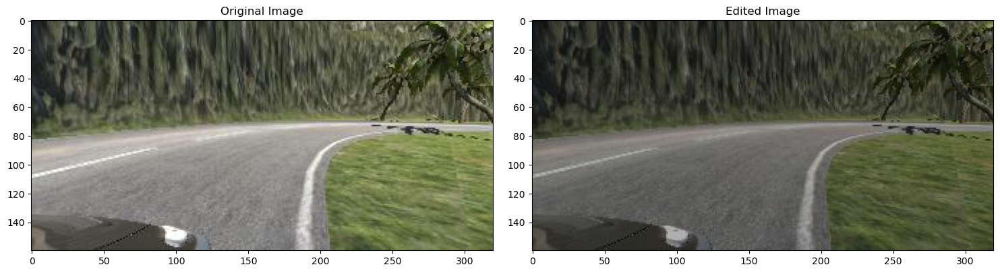

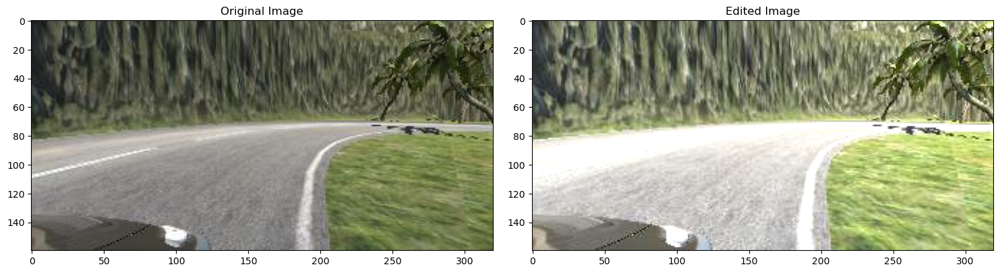

In [22]:
# changes the brightness of the image to account for daylight and night to make our model more robust
def change_brightness(image, darken):
    # makes the image darker
    if darken:
        datagen = ImageDataGenerator(brightness_range=[0.1,0.9])
    # brighten the image
    else:
        datagen = ImageDataGenerator(brightness_range=[1.1,1.9])
    samples = expand_dims(image, 0)
    it = datagen.flow(samples, batch_size=1)
    image = next(it)[0].astype('uint8')
    return image


display_two_images(test_image, change_brightness(test_image, True))
display_two_images(test_image, change_brightness(test_image, False))

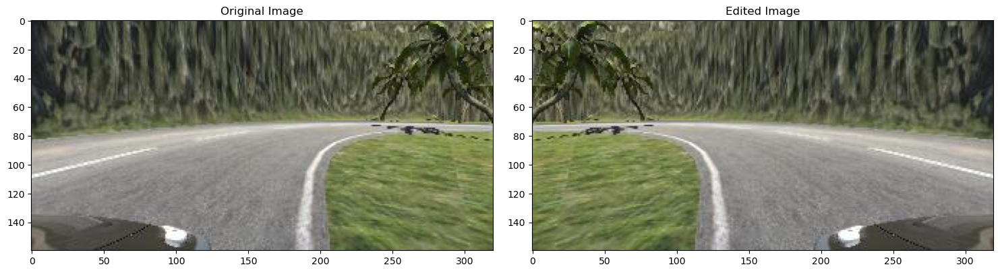

In [23]:
# this functions flips the image and reverses the steering angle to account for the flip
def balance(image, angle):
    image = cv2.flip(image, 1)
    angle = -angle
    return image, angle


test_steering = angles[0]
image, angle = balance(test_image, test_steering)
display_two_images(test_image, image)


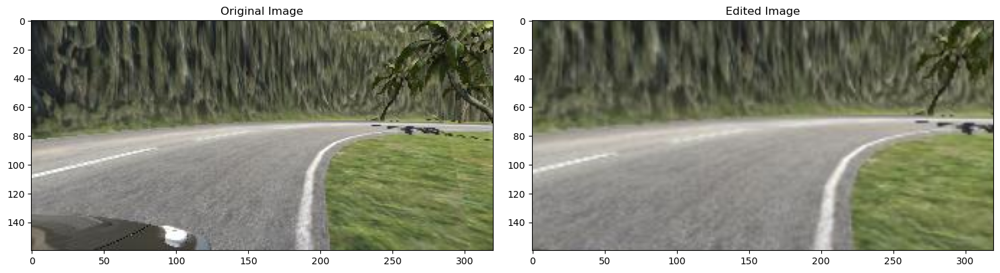

In [24]:
# zoom in the image
def zoom(image, range):
    zoom = iaa.Affine(scale=(1, range))
    image = zoom.augment_image(image)
    return image


display_two_images(test_image, zoom(test_image, 1.5))

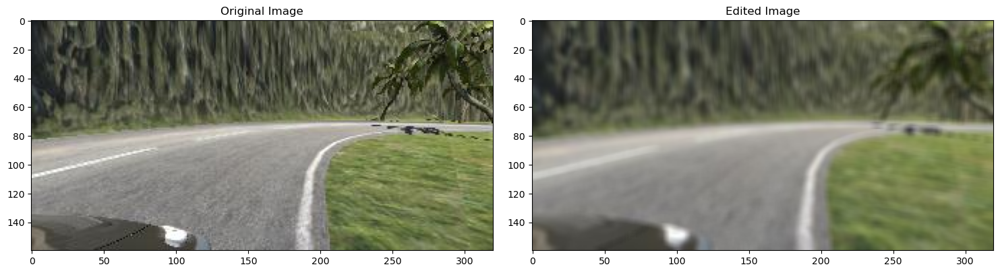

In [25]:
#blurs the image to add noise
def noiseblur(image, range):
    ksize = (range, range)
    image = cv2.blur(image, ksize) 
    return image

display_two_images(test_image, noiseblur(test_image, 5))

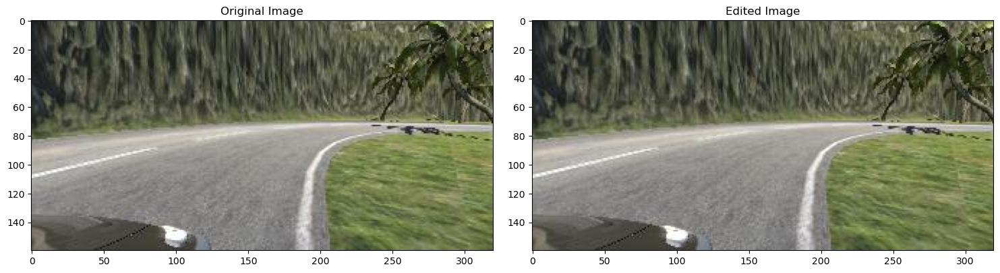

In [26]:
# scales and preprocesses images to have similar heights and widths. It re-scales data to have a standard deviation of 1 (unit variance) and a mean of 0
def standardize(image):
    datagen = ImageDataGenerator(featurewise_center =True, featurewise_std_normalization = True)
    samples = expand_dims(image, 0)
    it = datagen.flow(samples, batch_size=1)
    image = next(it)[0].astype('uint8')
    return image


display_two_images(test_image, standardize(test_image))

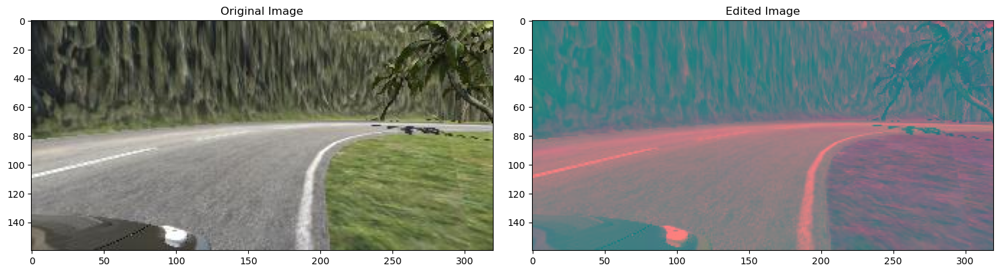

In [27]:
# convert images from RGB to YUV. According to this paper https://annals-csis.org/Volume_3/pliks/206.pdf,. The paper shows that the use
#of the YUV color space for a machine vision implementation can #give better subjective image quality than the RGB color space
def YUV(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2YUV)

display_two_images(test_image, YUV(test_image))

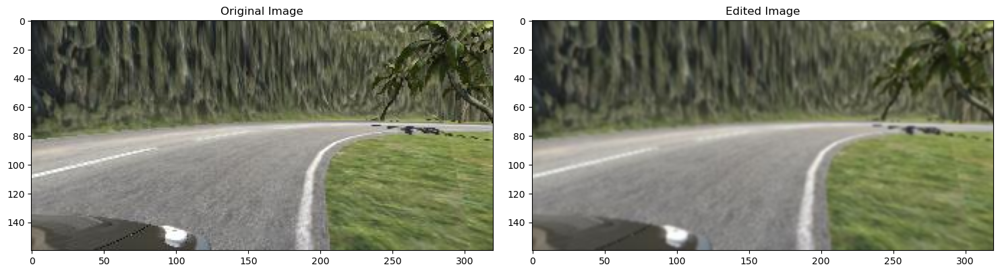

In [28]:
#Add gaussian blur to reduce image noise and reduce detail
def blur(image):
    return cv2.GaussianBlur(image, (3, 3), 0)


display_two_images(test_image, blur(test_image))

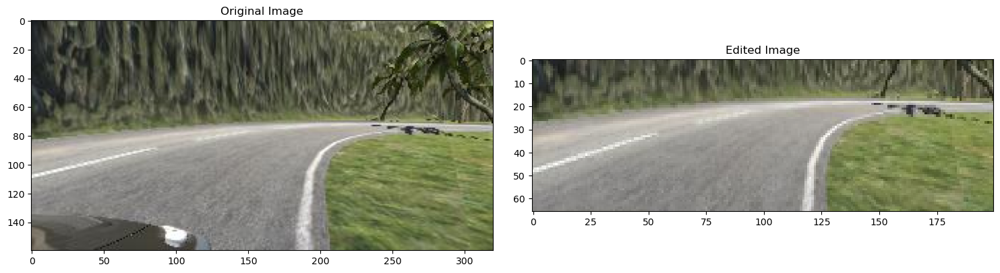

In [29]:
def resize(image):
    ## Crop image to remove irrelevant parts
    image = image[50:130, :, :]
    ## Decrease size for faster running time
    image = cv2.resize(image, (200, 66))
    return image


display_two_images(test_image, resize(test_image))

### Balancing Turns

In [30]:
# creats deep copies of the lists to avoid editing the original lists
images_balanced = copy.deepcopy(img)
images_route_1_balanced = copy.deepcopy(img_1)
images_route_2_balanced = copy.deepcopy(img_2)
angles_balanced = copy.deepcopy(angles)
angles_route_1_balanced = copy.deepcopy(angles_route_1)
angles_route_2_balanced = copy.deepcopy(angles_route_2)

In [31]:
## Remove some of the data that has a steering angle close to zero from the list
redundant_data = []
redundant_data_route_2 = []
pivot = len(angles_route_1)
pivot_2 = len(angles)
for i in range(10000):
    # This random index is for the data of the first route
    index_1 = random.randint(0, pivot- 1)
    if (angles_balanced[index_1] < 0.1 and angles_balanced[index_1] > - 0.1):
        redundant_data.append(index_1)

for i in range(20000):
    # This random index is for the data of the second route
    index_2 = random.randint(pivot, pivot_2 - 1)
    if (angles_balanced[index_2] < 0.1 and angles_balanced[index_2] > - 0.1):
        redundant_data_route_2.append(index_2)
        
# remove duplicates
redundant_data = [*set(redundant_data)]
redundant_data_route_2 = [*set(redundant_data_route_2)]
# sorts the indexes of the delete items in reverse so we delete the element with the largest indexes first to avoid missing up with the list indexes
redundant_data = sorted(redundant_data, reverse = True)
redundant_data_route_2 = sorted(redundant_data_route_2, reverse = True)

In [32]:
# remove the values from the lists
pivot = len(angles_route_1)
for i in redundant_data_route_2:
    angles_balanced.pop(i)
    del images_balanced[i]
    # we subtract the length of the data of the first route because the indexes of the removed elements are made according to the indexing of the original data
    angles_route_2_balanced.pop(i - pivot)
    del images_route_2_balanced[i - pivot]

for j in redundant_data:
    angles_balanced.pop(j)
    del images_balanced[j]
    angles_route_1_balanced.pop(j)
    del images_route_1_balanced[j]
    

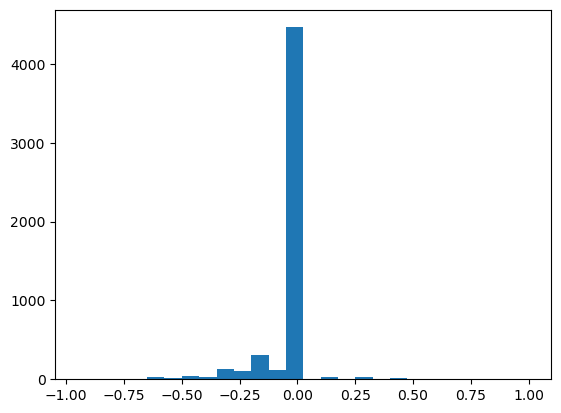

In [33]:
# Visualiaze the distribution of turns before balancing 
n_unbalanced, bins_unbalanced, patches_unbalanced = plt.hist(angles_route_1, bins = 26)

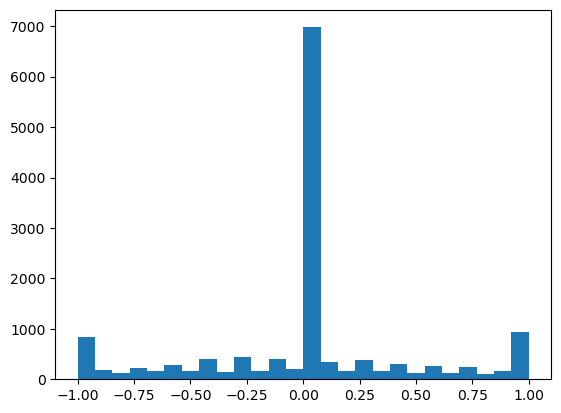

In [34]:
# Visualiaze the distribution of turns before balancing 
n_unbalanced, bins_unbalanced, patches_unbalanced = plt.hist(angles_route_2, bins = 26)

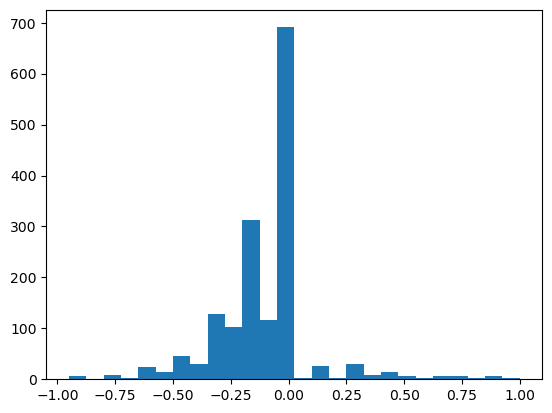

In [35]:
# Visualiaze the distribution of turns after removing redundant data
n_unbalanced, bins_unbalanced, patches_unbalanced = plt.hist(angles_route_1_balanced, bins = 26)

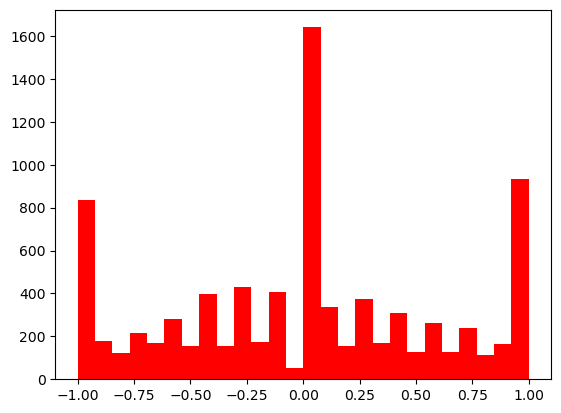

In [36]:
# Visualiaze the distribution of turns after removing redundant data
n_unbalanced, bins_unbalanced, patches_unbalanced = plt.hist(angles_route_2_balanced, bins = 26, color = 'red')

In [37]:
# balance right and left turns
pivot = len(images_route_1_balanced)
for i in range(3000):
    # Gets a random index of route_1 data since the imbalance is concenterated in route_1 data
    index = random.randint(0, pivot - 1)
    images_balanced[index], angles_balanced[index] = balance(images_balanced[index], angles_balanced[index])
    images_route_1_balanced[index], angles_route_1_balanced[index] = balance(images_route_1_balanced[index], angles_route_1_balanced[index])

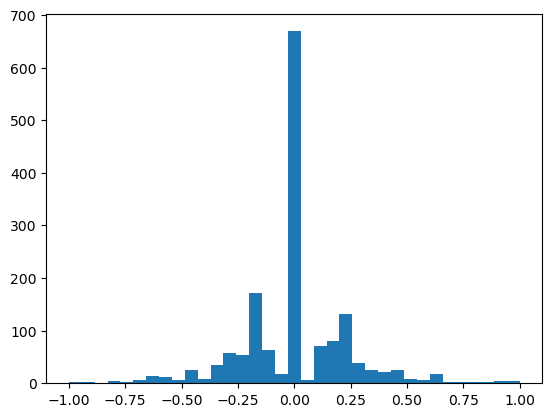

In [38]:
n_balanced, bins_balanced, patches_balanced  = plt.hist(angles_route_1_balanced, 35)

The number of right and left turns is more balanced compared to the original data, and the distribution of the data is more uniform after removing some of the data corresponding to going straight.

### Adding noise to the dataset
To make the model more robust and deployable, I augmented the data by adding noise in the form of randomized rotations, shifts, and blurs. Furthermore, I decided to change the brightness of some of the images randomly to ensure the model is capable of working in both day and night and in shade. Also, the added noise will help the model escape local minimum and avoid over-fitting.

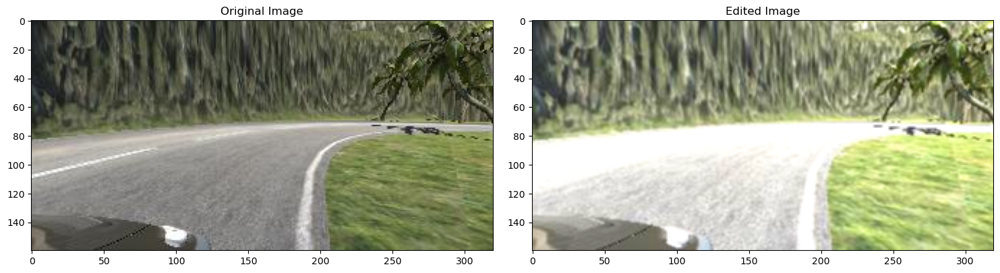

In [39]:
# it randomly shifts and rotates an image, changes its brightness, and blurs it
def noise(image):
    if(random.randint(0, 1)):
        image = change_brightness(image, random.randint(0, 1))
    if(random.randint(0,1)):
        image = shift(image, random.randint(0, 50))
    if(random.randint(0,1)):
        image = rotate(image, random.randint(0, 30))
    if(random.randint(0,1)):
        image = noiseblur(image, random.randint(1, 5))
    return image
        
        
display_two_images(test_image, noise(test_image))

In [40]:
# Split Training and Test Data
images_train, images_validation, angles_train, angles_validation = train_test_split(
    images_balanced, angles_balanced, test_size = 0.33, random_state = 47
)

In [41]:
# creates a deep copies of the dataset to add noise to without changing original datasets
train_images_balanced_noise = copy.deepcopy(images_train)

In [42]:
route_1 = len(train_images_balanced_noise)
for i in range(500):
    index_1 = random.randint(0, route_1 - 1)
    train_images_balanced_noise[index_1] = noise(train_images_balanced_noise[index_1])

## Pre-Processing Function
#### Normalization
I normalized the pixel values to lie between 0 and 1 to reduce the effect of variations in lighting, contrast, and color.
#### YUV
I decided to use YUV color space over RGB to separate color and brightness information, allowing for more efficient analysis of the image data.
### Standardization
I standardized the pixel values to have consistent mean and standard deviation to standardize the brightness and contrast of the images, making them more comparable and easier to process by the neural network.
### Resize
I cropped the image to disregard irrelevant features and decreased the size for lighter, faster processing
### Gaussian Blur
I used Gaussian Blur to pre-process the images to reduce image noise and smooth out details. It is useful because it can help improve the accuracy of subsequent computer vision algorithms by reducing the effect of noise and other image artifacts


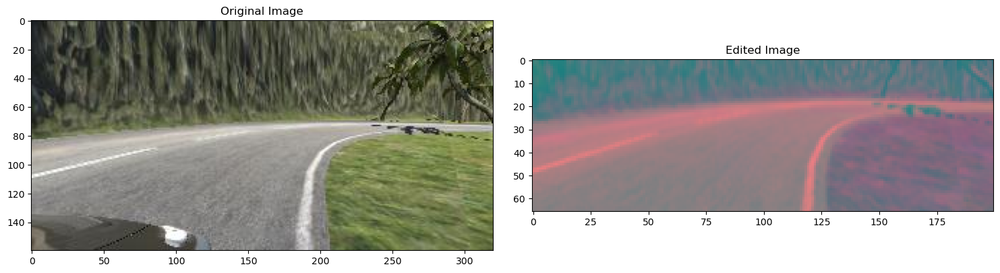

In [43]:
# it crops irrelevant parts of the image, reduces its size, use GaussianBlur to reduce noise, converts from RGB to YUV, normalizes, centers, and standardizes pixel values
def process(image):
    image = YUV(image)
    image = blur(image)
    image = standardize(image)
    image = resize(image)
    image = normalize(image)
    return image
    
    
display_two_images(test_image, process(test_image))

## Setting Up DataLoaders

In [44]:
# this data loader shuffles the two arrays and then loads data sequentially
def data_loader(images_array, angles_array, batch_size):
    # shuffles the two arrays
    temp = list(zip(images_array, angles_array))
    random.shuffle(temp)
    placeholder1, placeholder2 = zip(*temp) 
    images_array, angles_array = list(placeholder1), list(placeholder2)
    array_size =  len(images_array) 
    index = 0
    while True:
        images_batch = []
        angles_batch = []
        for i in range(batch_size):
            index += 1
            if(index >= array_size):
                index = 0
            image = process(images_array[index])
            images_batch.append(image)
            angles_batch.append(angles_array[index])

        yield (np.asarray(images_batch), np.asarray(angles_batch))

In [45]:
# this data loader loads random sample of the data every time 
def data_loader_random(images_array, angles_array, batch_size):
    while True:
        images_batch = []
        angles_batch = []
        array_size = len(images_array) 
        for i in range(batch_size):
            index = random.randint(0, array_size - 1)
            image = process(images_array[index])
            images_batch.append(image)
            angles_batch.append(angles_array[index])

        yield (np.asarray(images_batch), np.asarray(angles_batch))

[-0.7500002]
[-0.15]


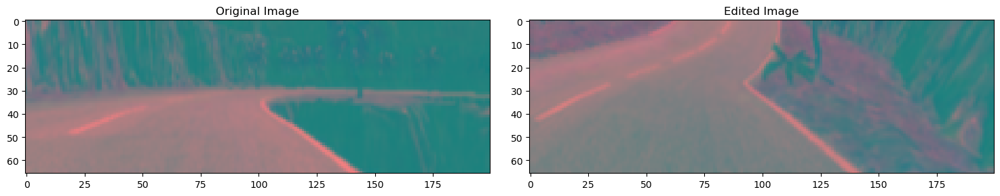

In [46]:
# Testing the data loader
image_train_load, steering_train_load = next(data_loader(images_train, angles_train, 1))
image_validation_load, steering_validation_load = next(data_loader(images_validation, angles_validation, 1))
print(steering_train_load)
print(steering_validation_load)
display_two_images(np.ndarray.tolist(image_train_load)[0], np.ndarray.tolist(image_validation_load)[0])

## Designing and Deploying the Model
### Use ReLu Activation

In [80]:
Activation = "relu"
input_shapes = (66,200,3)
def Model1():
  model = Sequential()
  # add convolution layers
  model.add(Convolution2D(18, (3,3), input_shape = input_shapes, activation = Activation))
  model.add(Convolution2D(24, (3,3), input_shape = input_shapes, activation = Activation))
  model.add(MaxPooling2D((2, 2)))
  model.add(Convolution2D(36, (3,3), activation = Activation))
  model.add(Convolution2D(48, (3,3), activation = Activation)) 
  model.add(MaxPooling2D((2, 2)))
  model.add(Convolution2D(64, (3,3), activation = Activation))  
  model.add(Convolution2D(96, (3,3), activation = Activation))
  model.add(MaxPooling2D((2, 2))) 
  model.add(Convolution2D(128, (3,3), activation = Activation))
  model.add(MaxPooling2D((2, 2)))

  
  #Flatten the output from convolutional layers
  model.add(Dropout(0.5))
  model.add(Flatten())
  
  #adds fully-connected layers
  model.add(Dense(100, activation = Activation))
  model.add(Dropout(0.5))
  model.add(Dense(50, activation = Activation))
  model.add(Dropout(0.5))
  model.add(Dense(10, activation = Activation))
  model.add(Dropout(0.5))
  
  # Output layer
  model.add(Dense(1, name='output'))
  # Compile the model
  model.compile(optimizer=Adam(lr=0.0001), loss="mse")
  return model

In [81]:
model = Model1()
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 64, 198, 18)       504       
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 62, 196, 24)       3912      
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 31, 98, 24)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 29, 96, 36)        7812      
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 27, 94, 48)        15600     
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 13, 47, 48)        0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 11, 45, 64)       

### Mini-Batch Gradient Descent 

In [82]:
batch_size = 100
Model_results = model.fit(
    data_loader(images_train, angles_train, batch_size),
    shuffle = 1,
    steps_per_epoch = 300,
    epochs = 25,
    validation_data = data_loader(images_validation, angles_validation, batch_size),
    validation_steps = 300,
    verbose = 1,
)

Epoch 1/25
300/300 [==============================] - 78s 254ms/step - loss: 0.2809 - val_loss: 0.2131
Epoch 2/25
300/300 [==============================] - 78s 259ms/step - loss: 0.2287 - val_loss: 0.1724
Epoch 3/25
300/300 [==============================] - 70s 235ms/step - loss: 0.1944 - val_loss: 0.1432
Epoch 4/25
300/300 [==============================] - 79s 263ms/step - loss: 0.1759 - val_loss: 0.1316
Epoch 5/25
300/300 [==============================] - 71s 237ms/step - loss: 0.1656 - val_loss: 0.1251
Epoch 6/25
300/300 [==============================] - 72s 240ms/step - loss: 0.1599 - val_loss: 0.1204
Epoch 7/25
300/300 [==============================] - 72s 242ms/step - loss: 0.1557 - val_loss: 0.1158
Epoch 8/25
300/300 [==============================] - 72s 241ms/step - loss: 0.1506 - val_loss: 0.1123
Epoch 9/25
300/300 [==============================] - 73s 244ms/step - loss: 0.1466 - val_loss: 0.1047
Epoch 10/25
300/300 [==============================] - 72s 240ms/step - l

Text(0.5, 0, 'Epoch')

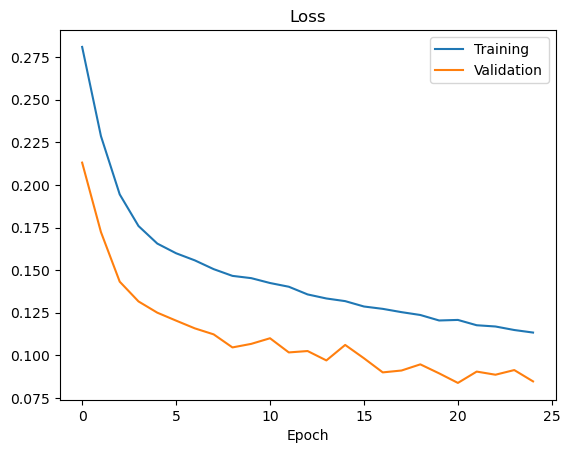

In [84]:
plt.plot(Model_results.history["loss"])
plt.plot(Model_results.history["val_loss"])
plt.legend(["Training", "Validation"])
plt.title("Loss")
plt.xlabel("Epoch")

### Stochastic gradient descent

In [95]:
# Stochastic gradient descent, going only 1 image at a time
batch_size = 1
Model_results_Stochastic = model.fit(
    data_loader(images_train, angles_train, batch_size),
    shuffle = 1,
    steps_per_epoch = 20000,
    epochs = 25,
    validation_data = data_loader(images_validation, angles_validation, batch_size),
    validation_steps = 20000,
    verbose = 1,
)

Epoch 1/25
20000/20000 [==============================] - 132s 7ms/step - loss: 0.1354 - val_loss: 0.1183
Epoch 2/25
20000/20000 [==============================] - 130s 7ms/step - loss: 0.1183 - val_loss: 0.1054
Epoch 3/25
20000/20000 [==============================] - 129s 6ms/step - loss: 0.1045 - val_loss: 0.1022
Epoch 4/25
20000/20000 [==============================] - 129s 6ms/step - loss: 0.0960 - val_loss: 0.1019
Epoch 5/25
20000/20000 [==============================] - 136s 7ms/step - loss: 0.0881 - val_loss: 0.1012
Epoch 6/25
20000/20000 [==============================] - 129s 6ms/step - loss: 0.0826 - val_loss: 0.0986
Epoch 7/25
20000/20000 [==============================] - 130s 7ms/step - loss: 0.0794 - val_loss: 0.0989
Epoch 8/25
20000/20000 [==============================] - 129s 6ms/step - loss: 0.0768 - val_loss: 0.0948
Epoch 9/25
20000/20000 [==============================] - 129s 6ms/step - loss: 0.0743 - val_loss: 0.1074
Epoch 10/25
20000/20000 [=====================

Text(0.5, 0, 'Epoch')

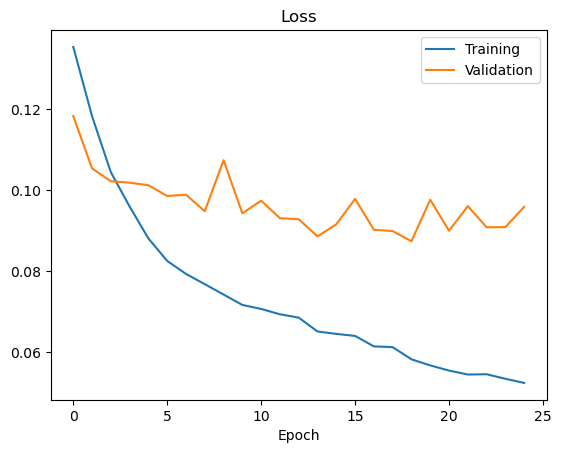

In [96]:
plt.plot(Model_results_Stochastic.history["loss"])
plt.plot(Model_results_Stochastic.history["val_loss"])
plt.legend(["Training", "Validation"])
plt.title("Loss")
plt.xlabel("Epoch")

## (Batch) gradient descent

In [110]:
#Due to local compuational resources, (Batch) gradient descent is not feasible. The largest I can do is running 1/16 of the data every iteration

Model_results_Batch = model.fit(
    data_loader(images_train, angles_train, round(len(angles_train)/16)),
    shuffle = 1,
    steps_per_epoch = 32,
    epochs = 25,
    validation_data = data_loader(images_validation, angles_validation, round(len(images_validation)/16)),
    validation_steps = 32,
    verbose = 1,
)

Epoch 1/25
32/32 [==============================] - 81s 3s/step - loss: 0.0533 - val_loss: 0.0924
Epoch 2/25
32/32 [==============================] - 63s 2s/step - loss: 0.0527 - val_loss: 0.0900
Epoch 3/25
32/32 [==============================] - 71s 2s/step - loss: 0.0508 - val_loss: 0.0888
Epoch 4/25
32/32 [==============================] - 68s 2s/step - loss: 0.0507 - val_loss: 0.0882
Epoch 5/25
32/32 [==============================] - 68s 2s/step - loss: 0.0501 - val_loss: 0.0878
Epoch 6/25
32/32 [==============================] - 68s 2s/step - loss: 0.0491 - val_loss: 0.0874
Epoch 7/25
32/32 [==============================] - 64s 2s/step - loss: 0.0510 - val_loss: 0.0872
Epoch 8/25
32/32 [==============================] - 74s 2s/step - loss: 0.0486 - val_loss: 0.0871
Epoch 9/25
32/32 [==============================] - 64s 2s/step - loss: 0.0498 - val_loss: 0.0870
Epoch 10/25
32/32 [==============================] - 64s 2s/step - loss: 0.0483 - val_loss: 0.0870
Epoch 11/25
32/32 [

Text(0.5, 0, 'Epoch')

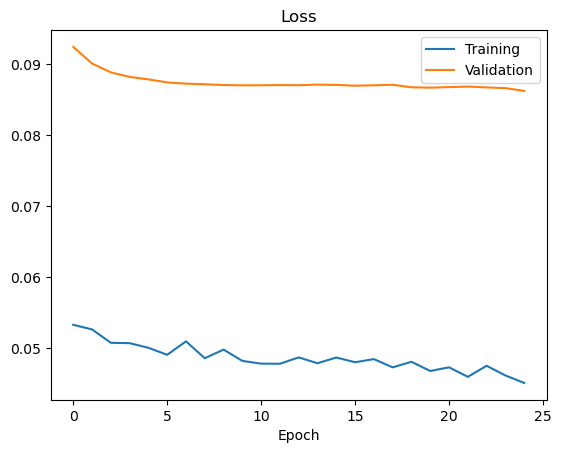

In [111]:
plt.plot(Model_results_Batch.history["loss"])
plt.plot(Model_results_Batch.history["val_loss"])
plt.legend(["Training", "Validation"])
plt.title("Loss")
plt.xlabel("Epoch")

### eLU activation function

In [85]:
Activation = "elu"
input_shapes = (66,200,3)
def Model3():
  model = Sequential()
  # add convolution layers
  model.add(Convolution2D(18, (3,3), input_shape = input_shapes, activation = Activation))
  model.add(Convolution2D(24, (3,3), input_shape = input_shapes, activation = Activation))
  model.add(MaxPooling2D((2, 2)))
  model.add(Convolution2D(36, (3,3), activation = Activation))
  model.add(Convolution2D(48, (3,3), activation = Activation)) 
  model.add(MaxPooling2D((2, 2)))
  model.add(Convolution2D(64, (3,3), activation = Activation))  
  model.add(Convolution2D(96, (3,3), activation = Activation))
  model.add(MaxPooling2D((2, 2))) 
  model.add(Convolution2D(128, (3,3), activation = Activation))
  model.add(MaxPooling2D((2, 2)))

  
  #Flatten the output from convolutional layers
  model.add(Dropout(0.5))
  model.add(Flatten())
  
  #adds fully-connected layers
  model.add(Dense(100, activation = Activation))
  model.add(Dropout(0.5))
  model.add(Dense(50, activation = Activation))
  model.add(Dropout(0.5))
  model.add(Dense(10, activation = Activation))
  model.add(Dropout(0.5))
  
  # Output layer
  model.add(Dense(1, name='output'))
  # Compile the model
  model.compile(optimizer=Adam(lr=0.0001), loss="mse")
  return model

In [86]:
model = Model3()
print(model.summary())

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_23 (Conv2D)           (None, 64, 198, 18)       504       
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 62, 196, 24)       3912      
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 31, 98, 24)        0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 29, 96, 36)        7812      
_________________________________________________________________
conv2d_26 (Conv2D)           (None, 27, 94, 48)        15600     
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 13, 47, 48)        0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 11, 45, 64)       

In [87]:
batch_size = 100
Model_results_elu = model.fit(
    data_loader(images_train, angles_train, batch_size),
    shuffle = 1,
    steps_per_epoch = 300,
    epochs = 25,
    validation_data = data_loader(images_validation, angles_validation, batch_size),
    validation_steps = 300,
    verbose = 1,
)

Epoch 1/25
300/300 [==============================] - 79s 258ms/step - loss: 0.2629 - val_loss: 0.1652
Epoch 2/25
300/300 [==============================] - 89s 296ms/step - loss: 0.1937 - val_loss: 0.1512
Epoch 3/25
300/300 [==============================] - 73s 242ms/step - loss: 0.1768 - val_loss: 0.1376
Epoch 4/25
300/300 [==============================] - 72s 241ms/step - loss: 0.1648 - val_loss: 0.1246
Epoch 5/25
300/300 [==============================] - 64s 212ms/step - loss: 0.1529 - val_loss: 0.1202
Epoch 6/25
300/300 [==============================] - 65s 216ms/step - loss: 0.1436 - val_loss: 0.1119
Epoch 7/25
300/300 [==============================] - 69s 229ms/step - loss: 0.1371 - val_loss: 0.1094
Epoch 8/25
300/300 [==============================] - 65s 215ms/step - loss: 0.1271 - val_loss: 0.1045
Epoch 9/25
300/300 [==============================] - 64s 215ms/step - loss: 0.1223 - val_loss: 0.1077
Epoch 10/25
300/300 [==============================] - 67s 223ms/step - l

Text(0.5, 0, 'Epoch')

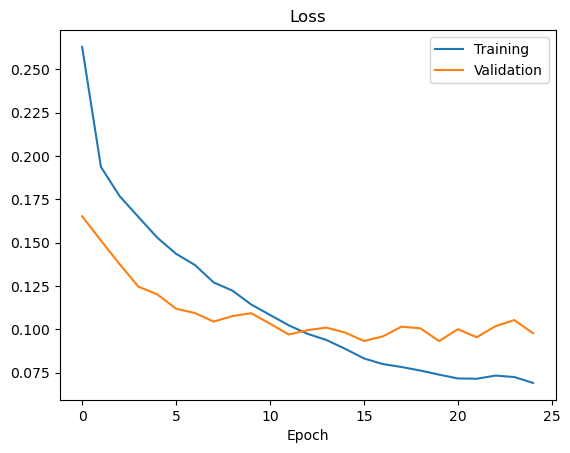

In [92]:
plt.plot(Model_results_elu.history["loss"])
plt.plot(Model_results_elu.history["val_loss"])
plt.legend(["Training", "Validation"])
plt.title("Loss")
plt.xlabel("Epoch")

Clearly this model is over-fitting. One way to reduce over-fitting is to make it simpler. Also, I will try both ReLU and eLU activation functions.
## Lighter Model
### eLU Activation Function

In [73]:
Activation = "elu"
input_shapes = (66,200,3)
def Model2():
  model = Sequential()
  # add convolution layers
  model.add(Convolution2D(24, (3,3), input_shape = input_shapes, activation = Activation))
  model.add(MaxPooling2D((2, 2)))
  model.add(Convolution2D(36, (3,3), activation = Activation))
  model.add(Convolution2D(48, (3,3), activation = Activation))
  model.add(MaxPooling2D((2, 2)))
  model.add(Convolution2D(64, (3,3), activation = Activation))  
  model.add(MaxPooling2D((2, 2)))
  model.add(Convolution2D(64, (3,3), activation = Activation))
  model.add(MaxPooling2D((2, 2)))


 
  #Flatten the output from convolutional layers
  model.add(Dropout(0.5))
  model.add(Flatten())
 
  #adds fully-connected layers
  model.add(Dense(100, activation = Activation))
  model.add(Dropout(0.5))
  model.add(Dense(50, activation = Activation))
  model.add(Dropout(0.5))
  model.add(Dense(10, activation = Activation))
  model.add(Dropout(0.5))
 
  # Output layer
  model.add(Dense(1, name='output'))
  # Compile the model
  model.compile(optimizer=Adam(lr=0.0001), loss="mse")
  return model


In [74]:
model_2 = Model2()
print(model_2.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 64, 198, 24)       672       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 32, 99, 24)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 30, 97, 36)        7812      
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 28, 95, 48)        15600     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 14, 47, 48)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 12, 45, 64)        27712     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 6, 22, 64)        

In [75]:
batch_size = 100
Model_results_2 = model_2.fit(
    data_loader(images_train, angles_train, batch_size),
    shuffle = 1,
    steps_per_epoch = 300,
    epochs = 25,
    validation_data = data_loader(images_validation, angles_validation, batch_size),
    validation_steps = 300,
    verbose = 1,
)

Epoch 1/25
300/300 [==============================] - 75s 245ms/step - loss: 0.2716 - val_loss: 0.1783
Epoch 2/25
300/300 [==============================] - 73s 245ms/step - loss: 0.2069 - val_loss: 0.1608
Epoch 3/25
300/300 [==============================] - 68s 226ms/step - loss: 0.1906 - val_loss: 0.1451
Epoch 4/25
300/300 [==============================] - 70s 234ms/step - loss: 0.1760 - val_loss: 0.1347
Epoch 5/25
300/300 [==============================] - 65s 215ms/step - loss: 0.1661 - val_loss: 0.1294
Epoch 6/25
300/300 [==============================] - 73s 242ms/step - loss: 0.1592 - val_loss: 0.1213
Epoch 7/25
300/300 [==============================] - 70s 232ms/step - loss: 0.1511 - val_loss: 0.1173
Epoch 8/25
300/300 [==============================] - 65s 219ms/step - loss: 0.1474 - val_loss: 0.1176
Epoch 9/25
300/300 [==============================] - 72s 239ms/step - loss: 0.1393 - val_loss: 0.1140
Epoch 10/25
300/300 [==============================] - 69s 232ms/step - l

Text(0.5, 0, 'Epoch')

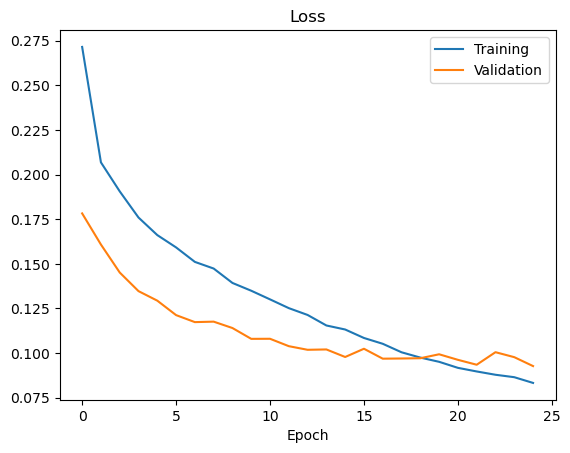

In [76]:
plt.plot(Model_results_2.history["loss"])
plt.plot(Model_results_2.history["val_loss"])
plt.legend(["Training", "Validation"])
plt.title("Loss")
plt.xlabel("Epoch")

### ReLU Activation Function

In [88]:
Activation = "relu"
input_shapes = (66,200,3)
def Model4():
  model = Sequential()
  # add convolution layers
  model.add(Convolution2D(24, (3,3), input_shape = input_shapes, activation = Activation))
  model.add(MaxPooling2D((2, 2)))
  model.add(Convolution2D(36, (3,3), activation = Activation))
  model.add(Convolution2D(48, (3,3), activation = Activation))
  model.add(MaxPooling2D((2, 2)))
  model.add(Convolution2D(64, (3,3), activation = Activation))  
  model.add(MaxPooling2D((2, 2)))
  model.add(Convolution2D(64, (3,3), activation = Activation))
  model.add(MaxPooling2D((2, 2)))


 
  #Flatten the output from convolutional layers
  model.add(Dropout(0.5))
  model.add(Flatten())
 
  #adds fully-connected layers
  model.add(Dense(100, activation = Activation))
  model.add(Dropout(0.5))
  model.add(Dense(50, activation = Activation))
  model.add(Dropout(0.5))
  model.add(Dense(10, activation = Activation))
  model.add(Dropout(0.5))
 
  # Output layer
  model.add(Dense(1, name='output'))
  # Compile the model
  model.compile(optimizer=Adam(lr=0.0001), loss="mse")
  return model


In [89]:
model_2_relu = Model4()
print(model_2_relu.summary())

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_30 (Conv2D)           (None, 64, 198, 24)       672       
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 32, 99, 24)        0         
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 30, 97, 36)        7812      
_________________________________________________________________
conv2d_32 (Conv2D)           (None, 28, 95, 48)        15600     
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 14, 47, 48)        0         
_________________________________________________________________
conv2d_33 (Conv2D)           (None, 12, 45, 64)        27712     
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 6, 22, 64)        

In [90]:
batch_size = 100
Model_results_2_relu = model_2_relu.fit(
    data_loader(images_train, angles_train, batch_size),
    shuffle = 1,
    steps_per_epoch = 300,
    epochs = 25,
    validation_data = data_loader(images_validation, angles_validation, batch_size),
    validation_steps = 300,
    verbose = 1,
)

Epoch 1/25
300/300 [==============================] - 64s 211ms/step - loss: 0.2979 - val_loss: 0.2470
Epoch 2/25
300/300 [==============================] - 63s 211ms/step - loss: 0.2468 - val_loss: 0.1910
Epoch 3/25
300/300 [==============================] - 63s 210ms/step - loss: 0.2112 - val_loss: 0.1611
Epoch 4/25
300/300 [==============================] - 63s 211ms/step - loss: 0.1949 - val_loss: 0.1500
Epoch 5/25
300/300 [==============================] - 63s 210ms/step - loss: 0.1841 - val_loss: 0.1377
Epoch 6/25
300/300 [==============================] - 63s 210ms/step - loss: 0.1749 - val_loss: 0.1308
Epoch 7/25
300/300 [==============================] - 63s 211ms/step - loss: 0.1675 - val_loss: 0.1274
Epoch 8/25
300/300 [==============================] - 63s 211ms/step - loss: 0.1622 - val_loss: 0.1204
Epoch 9/25
300/300 [==============================] - 63s 211ms/step - loss: 0.1565 - val_loss: 0.1219
Epoch 10/25
300/300 [==============================] - 63s 211ms/step - l

Text(0.5, 0, 'Epoch')

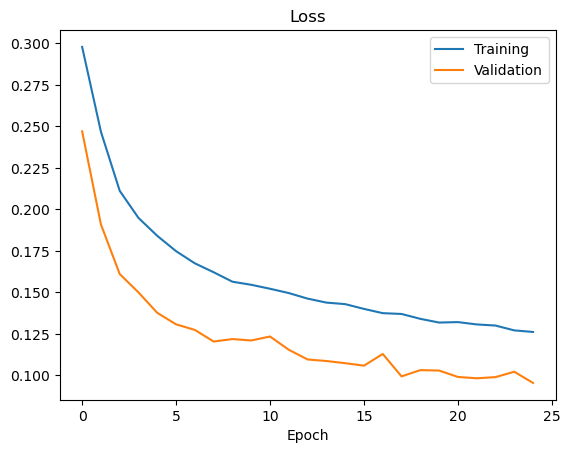

In [91]:
plt.plot(Model_results_2_relu.history["loss"])
plt.plot(Model_results_2_relu.history["val_loss"])
plt.legend(["Training", "Validation"])
plt.title("Loss")
plt.xlabel("Epoch")

To evaluate my model against other models, I will test various off-the-shelf models, such as Xception, ResNet, and MobileNet
## Deploying Off-the-shelf models
### Xception Model 

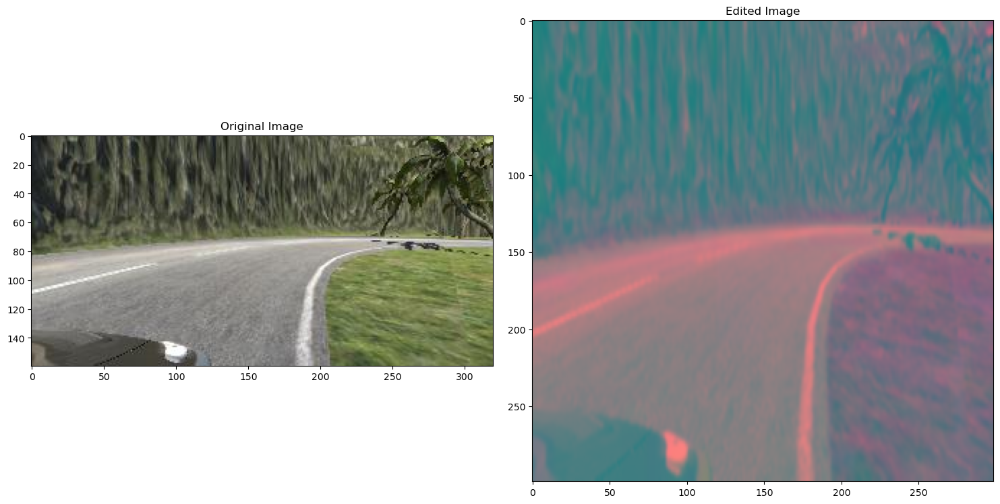

In [49]:
# it crops irrelevant parts of the image, reduces its size, use GaussianBlur to reduce noise, converts from RGB to YUV, normalizes, centers, and standardizes pixel values
# Size made specifically for Xception model
INP_SIZE = (299, 299)

def process_Xception(image):
    image = YUV(image)
    image = blur(image)
    image = standardize(image)
    image = tensorflow.image.resize(image, (INP_SIZE[0], INP_SIZE[1]))
    image = normalize(image)
    return image
    
    
display_two_images(test_image, process_Xception(test_image))

In [50]:
# this data loader shuffles the two arrays and then loads data sequentially and is made for Xception since it uses different pre-processing function to account for input size
def data_loader_Xception(images_array, angles_array, batch_size):
    # shuffles the two arrays
    temp = list(zip(images_array, angles_array))
    random.shuffle(temp)
    placeholder1, placeholder2 = zip(*temp) 
    images_array, angles_array = list(placeholder1), list(placeholder2)
    array_size =  len(images_array) 
    index = 0
    while True:
        images_batch = []
        angles_batch = []
        for i in range(batch_size):
            index += 1
            if(index >= array_size):
                index = 0
            image = process_Xception(images_array[index])
            images_batch.append(image)
            angles_batch.append(angles_array[index])

        yield (np.asarray(images_batch), np.asarray(angles_batch))

In [51]:
# deploying Xception Model to compare my model against it
model_Xception = tensorflow.keras.applications.Xception(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
)

In [52]:
print(model_Xception.summary())
model_Xception.compile(optimizer=Adam(lr=0.0001), loss="mse")

Model: "xception"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0           block1_conv1_bn[0][0]            
___________________________________________________________________________________________

In [294]:
Model_results_Xception = model_Xception.fit(
    data_loader_Xception(images_train, angles_train, 5),
    shuffle = 1,
    steps_per_epoch = 1400,
    epochs = 25,
    validation_data = data_loader_Xception(images_validation, angles_validation, 5),
    validation_steps = 1400,
    verbose = 1,
)

Epoch 1/25
1400/1400 [==============================] - 354s 253ms/step - loss: 0.3059 - val_loss: 0.3084
Epoch 2/25
1400/1400 [==============================] - 383s 274ms/step - loss: 0.3052 - val_loss: 0.3083
Epoch 3/25
1400/1400 [==============================] - 390s 279ms/step - loss: 0.3044 - val_loss: 0.3084
Epoch 4/25
1400/1400 [==============================] - 391s 279ms/step - loss: 0.3058 - val_loss: 0.3080
Epoch 5/25
1400/1400 [==============================] - 391s 279ms/step - loss: 0.3035 - val_loss: 0.3086
Epoch 6/25
1400/1400 [==============================] - 392s 280ms/step - loss: 0.3041 - val_loss: 0.3083
Epoch 7/25
1400/1400 [==============================] - 388s 277ms/step - loss: 0.3048 - val_loss: 0.3088
Epoch 8/25
1400/1400 [==============================] - 393s 281ms/step - loss: 0.3044 - val_loss: 0.3088
Epoch 9/25
1400/1400 [==============================] - 390s 279ms/step - loss: 0.3052 - val_loss: 0.3090
Epoch 10/25
1400/1400 [=======================

### ResNet50 and ResNet101

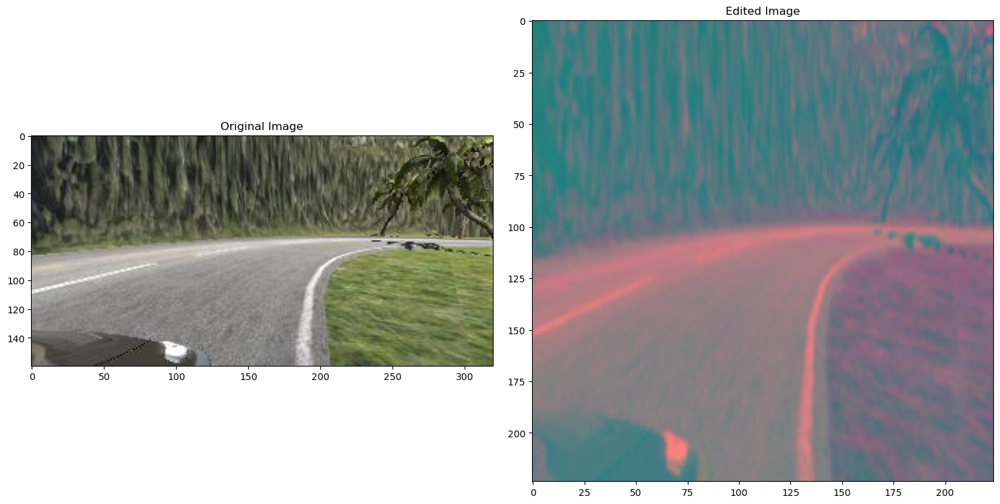

In [53]:
# it crops irrelevant parts of the image, reduces its size, use GaussianBlur to reduce noise, converts from RGB to YUV, normalizes, centers, and standardizes pixel values
# Size specifically for ResNet model
INP_SIZE = (224, 224)

def process_ResNet(image):
    image = YUV(image)
    image = blur(image)
    image = standardize(image)
    image = tensorflow.image.resize(image, (INP_SIZE[0], INP_SIZE[1]))
    image = normalize(image)
    return image
    
    
display_two_images(test_image, process_ResNet(test_image))

In [58]:
# this data loader shuffles the two arrays and then loads data sequentially and is made for ResNet since it uses different pre-processing function to account for input size
def data_loader_ResNet(images_array, angles_array, batch_size):
    # shuffles the two arrays
    temp = list(zip(images_array, angles_array))
    random.shuffle(temp)
    placeholder1, placeholder2 = zip(*temp) 
    images_array, angles_array = list(placeholder1), list(placeholder2)
    array_size =  len(images_array) 
    index = 0
    while True:
        images_batch = []
        angles_batch = []
        for i in range(batch_size):
            index += 1
            if(index >= array_size):
                index = 0
            image = process_ResNet(images_array[index])
            images_batch.append(image)
            angles_batch.append(angles_array[index])

        yield (np.asarray(images_batch), np.asarray(angles_batch))

In [55]:
# deploying ResNet50 Model to compare my model against it
model_resnet_50 = tensorflow.keras.applications.ResNet50(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
)

In [62]:
print(model_resnet_50 .summary())
model_resnet_50.compile(optimizer=Adam(lr=0.0001), loss="mse")

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

In [ ]:
Model_results_ResNet50 = model_resnet_50.fit(
    data_loader_ResNet(images_train, angles_train, 20),
    shuffle = 1,
    steps_per_epoch = 1400,
    epochs = 25,
    validation_data = data_loader_ResNet(images_validation, angles_validation, 20),
    validation_steps = 1400,
    verbose = 1,
)

In [64]:
# deploying ResNet101 Model to compare my model against it
model_resnet_101 = tensorflow.keras.applications.ResNet101(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
)

In [65]:
print(model_resnet_101 .summary())
model_resnet_101.compile(optimizer=Adam(lr=0.0001), loss="mse")

Model: "resnet101"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
__________________________________________________________________________________________

In [ ]:
Model_results_ResNet101 = model_resnet_101.fit(
    data_loader_ResNet(images_train, angles_train, 20),
    shuffle = 1,
    steps_per_epoch = 1400,
    epochs = 25,
    validation_data = data_loader_ResNet(images_validation, angles_validation, 20),
    validation_steps = 1400,
    verbose = 1,
)

### Deploying MobileNetv2 (lighter than ResNet and Xception)

In [67]:
Model_MobileNet = tensorflow.keras.applications.MobileNetV2(
    input_shape=None,
    alpha=1.0,
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
)

14548992/14536120 [==============================] - 1s 0us/step


In [68]:
print(Model_MobileNet .summary())
Model_MobileNet.compile(optimizer=Adam(lr=0.0001), loss="mse")

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         input_4[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 112, 112, 32) 0           bn_Conv1[0][0]                   
_______________________________________________________________________________

In [ ]:
Model_results_Mobilenet = Model_MobileNet.fit(
    # use the same dataloader as ResNet since the input size is the same (224, 224, 3)
    data_loader_ResNet(images_train, angles_train, 25),
    shuffle = 1,
    steps_per_epoch = 300,
    epochs = 10,
    validation_data = data_loader_ResNet(images_validation, angles_validation, 25),
    validation_steps = 300,
    verbose = 1,
)